In [1]:
import sys
import random
from pathlib import Path
import json

# Ajustar la ruta para que Python reconozca 'src'
PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

from src.config import MIDI_DIR, WAV_DIR, JAMS_DIR, DEFAULT_TEMPO
from src.generate_progression import generate_progression
from src.audio_conversion import convert_all_mid_in_folder
from src.jams_creation import create_jams_for_folder

print("MIDI_DIR =", MIDI_DIR)
print("WAV_DIR  =", WAV_DIR)
print("JAMS_DIR =", JAMS_DIR)
print("DEFAULT_TEMPO =", DEFAULT_TEMPO)


MIDI_DIR = /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi
WAV_DIR  = /home/cepatinog/MIR/final_project/chord_progression_generator/data2/wav
JAMS_DIR = /home/cepatinog/MIR/final_project/chord_progression_generator/data2/jams
DEFAULT_TEMPO = 60


In [2]:
# 2. Definir Progresiones

# Sufijos del diccionario
chord_suffixes = [
    "min", "maj", "dim", "aug",
    "min6", "maj6", "min7", "minmaj7",
    "maj7", "7", "dim7", "hdim7",
    "sus2", "sus4"
]

# Bases de 3 acordes
progression_bases_3 = [
    ("I", "IV", "V"),
    ("ii", "V", "I"),
    ("vii", "III", "VI"),
]


In [3]:

# 3. Crear combos aleatorios


# def random_suffix_combos(num_chords: int, suffix_list, sample_size=20):
#     """
#     Retorna una lista de tuplas, cada tupla contiene 'num_chords' sufijos.
#     Excluimos la tupla si TODOS los sufijos son iguales.
#     Muestreamos sample_size combos aleatorios sin reemplazo.
#     """
#     import itertools

#     # Generar todas las combinaciones cartesianas
#     # p.ej. si num_chords=3 => 14^3 combos
#     all_combos = list(itertools.product(suffix_list, repeat=num_chords))

#     # Filtrar combos que tengan todos los sufijos iguales
#     filtered = [c for c in all_combos if not all(s == c[0] for s in c)]

#     # Ajustar sample_size si excede
#     if sample_size > len(filtered):
#         sample_size = len(filtered)

#     # Seleccionar sample_size combos aleatorios
#     combos = random.sample(filtered, sample_size)
#     return combos

def balanced_suffix_combos(suffixes, num_chords=3, combos_per_suffix=1):
    """
    Genera progresiones de N acordes en las que cada sufijo aparece
    al menos combos_per_suffix veces. Total combos ≈ combos_per_suffix * len(suffixes)
    """
    import random

    combos = []

    for target in suffixes:
        for _ in range(combos_per_suffix):
            # Mezclar el target con otros sufijos aleatorios
            other_sufs = random.sample([s for s in suffixes if s != target], num_chords - 1)
            full_combo = other_sufs + [target]
            random.shuffle(full_combo)
            combos.append(tuple(full_combo))

    random.shuffle(combos)
    return combos


In [4]:
# --- 3) Generar .mid para las progresiones base (3 y 4 acordes) ---

def generate_all_mid():
    # EJEMPLO: para 3 acordes, tomamos 10 combos aleatorios
    for base_3 in progression_bases_3:
        # combos_3 = random_suffix_combos(num_chords=3, suffix_list=chord_suffixes, sample_size=10)
        combos_3 = balanced_suffix_combos(chord_suffixes, num_chords=3, combos_per_suffix=1)
        for combo in combos_3:
            # Construir algo p.ej. "I,maj - IV,min - V,7"
            prog_str = "-".join(f"{g},{suf}" for g, suf in zip(base_3, combo))
            folder_name = f"rand3_{'-'.join(base_3)}_{'_'.join(combo)}"
            generate_progression(prog_str, folder_name, MIDI_DIR, DEFAULT_TEMPO)

# Generar
generate_all_mid()

Generated progression 'I,sus2-IV,7-V,sus4' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_sus2_7_sus4
Generated progression 'I,minmaj7-IV,maj-V,7' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_minmaj7_maj_7
Generated progression 'I,min6-IV,sus4-V,maj6' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_min6_sus4_maj6
Generated progression 'I,maj6-IV,sus2-V,dim7' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_maj6_sus2_dim7
Generated progression 'I,sus4-IV,hdim7-V,min7' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_sus4_hdim7_min7
Generated progression 'I,dim7-IV,minmaj7-V,maj' -> folder: /home/cepatinog/MIR/final_project/chord_progression_generator/data2/midi/rand3_I-IV-V_dim7_minmaj7_maj
Generated progression 'I,hdim7-IV,min7-V,min6' -> fold

In [5]:
def parse_mid_filename(base_name: str):
    """
    Ejem: 'A-2-rand3_ii-V-I_dim7_min7_min-1'
    1) note_oct = 'A-2'
    2) remainder = 'rand3_ii-V-I_dim7_min7_min-1'
    """
    parts = base_name.split("-", 2)  
    if len(parts) < 3:
        print(f"[WARN] {base_name} no tiene formato esperado (nota-oct-randX...).")
        return None

    note_str = parts[0]  # 'A'
    oct_str  = parts[1]  # '2'
    remainder = parts[2] # 'rand3_ii-V-I_dim7_min7_min-1'

    # Extraer index final con rsplit('-',1)
    remainder_parts = remainder.rsplit("-", 1)
    if len(remainder_parts) < 2:
        print(f"[WARN] '{base_name}' no tiene '-<index>' al final.")
        return None

    middle_str = remainder_parts[0]  # 'rand3_ii-V-I_dim7_min7_min'
    idx_str    = remainder_parts[1]  # '1'

    try:
        inversion_index = int(idx_str)
    except:
        print(f"[WARN] Index '{idx_str}' no es entero.")
        inversion_index = 0

    # Partimos 'rand3_ii-V-I_dim7_min7_min' => ["rand3","ii-V-I","dim7_min7_min"]
    mid_parts = middle_str.split("_", 2)
    if len(mid_parts) < 3:
        print(f"[WARN] {middle_str} no sigue 'randX_base_sufijos'.")
        return None

    rand_part = mid_parts[0]  # 'rand3'
    base_part = mid_parts[1]  # 'ii-V-I'
    sufs_part = mid_parts[2]  # 'dim7_min7_min'

    if rand_part.startswith("rand3"):
        num_chords = 3
    elif rand_part.startswith("rand4"):
        num_chords = 4
    else:
        num_chords = 0

    base_chords = base_part.split("-")
    suffixes = sufs_part.split("_")

    if len(base_chords) != num_chords or len(suffixes) != num_chords:
        print(f"[WARN] mismatch #grados={len(base_chords)} y #sufs={len(suffixes)} vs {num_chords}")
        return None

    return {
        "note": note_str,
        "octave": oct_str,
        "base_chords": base_chords,
        "suffixes": suffixes,
        "inversion_index": inversion_index
    }


from src.jams_creation import create_jams_file

def parse_and_create_jams_in_folder(folder: Path):
    """
    1) lee durations.json
    2) itera cada .mid en la carpeta
       - parsea nombre
       - construye roman_sequence
       - llama create_jams_file con duraciones
    """
    durations_path = folder / "durations.json"
    if durations_path.exists():
        with open(durations_path, "r") as f:
            durations_dict = json.load(f)
    else:
        durations_dict = {}

    mid_files = list(folder.rglob("*.mid"))
    if not mid_files:
        print(f"No hay .mid en => {folder}")
        return

    for mf in mid_files:
        base_name = mf.stem  # e.g. "A-2-rand3_ii-V-I_dim7_min7_min-1"
        parsed = parse_mid_filename(base_name)
        if not parsed:
            continue

        base_chords = parsed["base_chords"]
        suffixes    = parsed["suffixes"]
        if len(base_chords) != len(suffixes):
            print(f"[WARN] chords != suffixes in {mf.name}")
            continue

        # p.ej. ['ii,dim7','V,min7','I,min']
        roman_sequence = [f"{g},{s}" for g,s in zip(base_chords, suffixes)]

        # Duraciones
        durations = durations_dict.get(f"{base_name}.mid", None)

        # Tonalidad
        note_tonality = parsed["note"]  # e.g. "A" (podrías parsear algo más si quisieras)

        jam_path = create_jams_file(
            roman_sequence=roman_sequence,
            key=note_tonality,
            jam_name=base_name,
            progression_name="-".join(roman_sequence),
            durations=durations
        )
        print(f"[JAMS] {mf.name} => {jam_path.name}")

def create_jams_all_folders():
    """
    Recorre MIDI_DIR, y para cada carpeta con .mid,
    llama parse_and_create_jams_in_folder
    """
    for p in MIDI_DIR.iterdir():
        if p.is_dir():
            parse_and_create_jams_in_folder(p)

create_jams_all_folders()
print("Generación de .jams completada.")


[JAMS] A-3-rand3_vii-III-VI_dim7_min_maj-24.mid => A-3-rand3_vii-III-VI_dim7_min_maj-24.jams
[JAMS] F#-5-rand3_vii-III-VI_dim7_min_maj-59.mid => F#-5-rand3_vii-III-VI_dim7_min_maj-59.jams
[JAMS] Eb-4-rand3_vii-III-VI_dim7_min_maj-36.mid => Eb-4-rand3_vii-III-VI_dim7_min_maj-36.jams
[JAMS] B-4-rand3_vii-III-VI_dim7_min_maj-44.mid => B-4-rand3_vii-III-VI_dim7_min_maj-44.jams
[JAMS] Eb-2-rand3_vii-III-VI_dim7_min_maj-55.mid => Eb-2-rand3_vii-III-VI_dim7_min_maj-55.jams
[JAMS] B-5-rand3_vii-III-VI_dim7_min_maj-48.mid => B-5-rand3_vii-III-VI_dim7_min_maj-48.jams
[JAMS] A-4-rand3_vii-III-VI_dim7_min_maj-20.mid => A-4-rand3_vii-III-VI_dim7_min_maj-20.jams
[JAMS] F#-3-rand3_vii-III-VI_dim7_min_maj-18.mid => F#-3-rand3_vii-III-VI_dim7_min_maj-18.jams
[JAMS] A-2-rand3_vii-III-VI_dim7_min_maj-7.mid => A-2-rand3_vii-III-VI_dim7_min_maj-7.jams
[JAMS] Bb-3-rand3_vii-III-VI_dim7_min_maj-50.mid => Bb-3-rand3_vii-III-VI_dim7_min_maj-50.jams
[JAMS] D-5-rand3_vii-III-VI_dim7_min_maj-20.mid => D-5-rand3_v

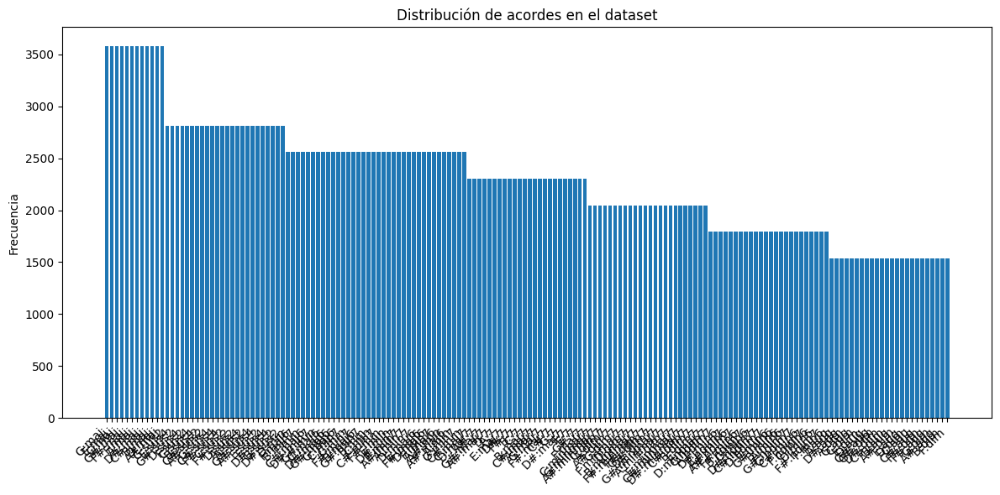

Acordes más frecuentes:
G:maj    → 3584
E:maj    → 3584
C:maj    → 3584
G#:maj   → 3584
F#:maj   → 3584
F:maj    → 3584
A:maj    → 3584
D#:maj   → 3584
C#:maj   → 3584
B:maj    → 3584
D:maj    → 3584
A#:maj   → 3584
G:sus2   → 2816
E:sus4   → 2816
G#:sus2  → 2816
D:sus4   → 2816
F:sus2   → 2816
C:sus4   → 2816
B:sus4   → 2816
C#:sus2  → 2816
A#:sus2  → 2816
G:sus4   → 2816
C#:sus4  → 2816
F#:sus4  → 2816
C:sus2   → 2816
F#:sus2  → 2816
D:sus2   → 2816
A:sus4   → 2816
A:sus2   → 2816
G#:sus4  → 2816
A#:sus4  → 2816
E:sus2   → 2816
F:sus4   → 2816
D#:sus4  → 2816
B:sus2   → 2816
D#:sus2  → 2816
D:min    → 2560
F:maj6   → 2560
B:min7   → 2560
F:min    → 2560
C#:maj6  → 2560
D#:min7  → 2560
G#:min   → 2560
C:maj6   → 2560
D#:maj6  → 2560
G#:maj6  → 2560
G:maj6   → 2560
C:min7   → 2560
G:min    → 2560
F#:min7  → 2560
B:maj6   → 2560
G#:min7  → 2560
B:min    → 2560
C:min    → 2560
C#:min7  → 2560
F#:min   → 2560
E:min    → 2560
D#:min   → 2560
E:min7   → 2560
A#:min7  → 2560
A:min7   → 2560


In [6]:
from pathlib import Path
import json
import collections
import matplotlib.pyplot as plt

def analyze_jams_chord_distribution(jams_folder: Path, top_k: int = None):
    """
    Visualiza la distribución de acordes (ej. 'A:min6') en archivos .jams de una carpeta.
    
    Args:
        jams_folder (Path): carpeta donde están los archivos .jams
        top_k (int): si se indica, muestra solo los K acordes más frecuentes
    """
    chord_counter = collections.Counter()
    jam_files = list(jams_folder.rglob("*.jams"))
    if not jam_files:
        print(f"[WARN] No hay archivos .jams en {jams_folder}")
        return

    # Recorremos cada archivo .jams
    for jam_path in jam_files:
        try:
            with open(jam_path, "r") as f:
                jam_data = json.load(f)
        except Exception as e:
            print(f"[ERROR] {jam_path.name} no se pudo leer: {e}")
            continue

        # Buscar anotaciones en namespace 'chord'
        annotations = jam_data.get("annotations", [])
        for ann in annotations:
            if ann.get("namespace") == "chord":
                for entry in ann.get("data", []):
                    chord = entry.get("value")
                    if chord:
                        chord_counter[chord] += 1

    if not chord_counter:
        print("[INFO] No se encontraron acordes.")
        return

    # Ordenar por frecuencia
    sorted_items = chord_counter.most_common(top_k)

    labels = [label for label, _ in sorted_items]
    counts = [count for _, count in sorted_items]

    # Plot
    plt.figure(figsize=(12, 6))
    bars = plt.bar(labels, counts)
    plt.title("Distribución de acordes en el dataset")
    plt.ylabel("Frecuencia")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Mostrar valores
    print("Acordes más frecuentes:")
    for label, count in sorted_items:
        print(f"{label:8s} → {count}")

# Ejemplo de uso
JAMS_FOLDER = Path("/home/cepatinog/MIR/final_project/chord_progression_generator/data2/jams")  # <--- CAMBIA ESTA RUTA
analyze_jams_chord_distribution(JAMS_FOLDER, top_k=168)


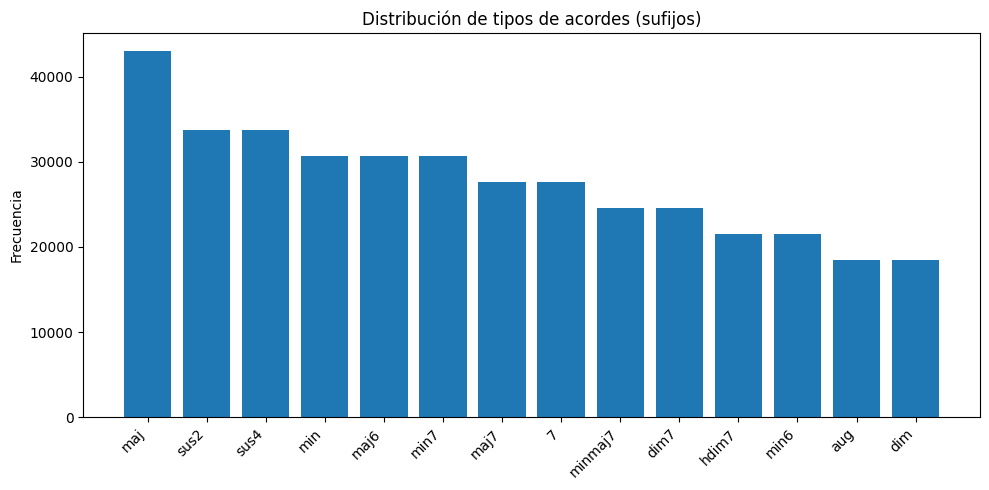

Tipos de acorde más frecuentes:
maj      → 43008
sus2     → 33792
sus4     → 33792
min      → 30720
maj6     → 30720
min7     → 30720
maj7     → 27648
7        → 27648
minmaj7  → 24576
dim7     → 24576
hdim7    → 21504
min6     → 21504
aug      → 18432
dim      → 18432


In [7]:
from pathlib import Path
import json
import collections
import matplotlib.pyplot as plt

def analyze_jams_suffix_distribution(jams_folder: Path, top_k: int = None):
    """
    Visualiza la distribución de tipos de acordes (ej. 'min', 'maj7') en archivos .jams.

    Args:
        jams_folder (Path): Carpeta donde están los archivos .jams
        top_k (int): Si se indica, muestra solo los K sufijos más frecuentes
    """
    suffix_counter = collections.Counter()
    jam_files = list(jams_folder.rglob("*.jams"))
    if not jam_files:
        print(f"[WARN] No hay archivos .jams en {jams_folder}")
        return

    for jam_path in jam_files:
        try:
            with open(jam_path, "r") as f:
                jam_data = json.load(f)
        except Exception as e:
            print(f"[ERROR] {jam_path.name} no se pudo leer: {e}")
            continue

        annotations = jam_data.get("annotations", [])
        for ann in annotations:
            if ann.get("namespace") == "chord":
                for entry in ann.get("data", []):
                    full_chord = entry.get("value")
                    if full_chord and ":" in full_chord:
                        _, suffix = full_chord.split(":", 1)  # p.ej. "A:min7" -> "min7"
                        suffix_counter[suffix] += 1

    if not suffix_counter:
        print("[INFO] No se encontraron acordes.")
        return

    # Ordenar y seleccionar top_k
    sorted_items = suffix_counter.most_common(top_k)

    labels = [label for label, _ in sorted_items]
    counts = [count for _, count in sorted_items]

    # Gráfico
    plt.figure(figsize=(10, 5))
    plt.bar(labels, counts)
    plt.title("Distribución de tipos de acordes (sufijos)")
    plt.ylabel("Frecuencia")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Mostrar valores en texto
    print("Tipos de acorde más frecuentes:")
    for label, count in sorted_items:
        print(f"{label:8s} → {count}")

# Ejemplo de uso:
JAMS_FOLDER = Path("/home/cepatinog/MIR/final_project/chord_progression_generator/data2/jams")  # <-- CAMBIA ESTA RUTA
analyze_jams_suffix_distribution(JAMS_FOLDER, top_k=20)
